In [1]:
!pip install segment-geospatial osmnx geopandas folium matplotlib mapclassify contextily leafmap localtileserver segment-geospatial

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.4/101.4 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 32.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 38.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.2/40.2 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 28.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 46.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 60.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 75.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [20]:
import os
import osmnx
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
import contextily as ctx
import leafmap
from samgeo import tms_to_geotiff, overlay_images
import shapely
import numpy as np
from PIL import Image

In [3]:
AOI = ['Saint Petersburg, Russia',
      #  'Tusina District, Leningrad Oblast',
      #  'Pushkinsky District, Leningrad Oblast',
      #  'Kolpinsky District',
       ]
aoi_gdf = osmnx.geocode_to_gdf(AOI)

#plot area of interest
basemap = aoi_gdf.explore(color='lightblue')
basemap

In [5]:
def gridding_map(gdf, total_bounds, cell_size=0.017460783333333296):
    # total area for the grid
    xmin, ymin, xmax, ymax = total_bounds
    # projection of the grid
    crs = gdf.crs
    # create the cells in a loop
    grid_cells = []
    for x0 in np.arange(xmin, xmax+cell_size, cell_size * 2):
        for y0 in np.arange(ymin, ymax+cell_size, cell_size):
            # bounds
            x1 = x0 + cell_size * 2
            y1 = y0 + cell_size
            box_geometry = shapely.geometry.box(x0, y0, x1, y1)
            if any(box_geometry.within(geom) for geom in gdf.geometry):
                grid_cells.append(box_geometry)
    cell = gpd.GeoDataFrame(grid_cells, columns=['geometry'],
                                    crs=crs)
    return cell

polygon_gdf = gpd.GeoDataFrame(geometry=[aoi_gdf.unary_union],
                               crs=aoi_gdf.crs)
grid = gridding_map(polygon_gdf, aoi_gdf.total_bounds)

In [6]:
grid.explore(color='red')

In [10]:
forest = osmnx.geometries_from_polygon(polygon = aoi_gdf.geometry.geometry.unary_union,
                                      tags = {'landuse': ['forest'], # 'cemetery'
                                              'natural': ['wood', 'wetland'],
                                              'wetland':'swamp',
                                              'wetland':'mangrove'})

                                              # "leisure":"park",
                                              # "landcover":"trees"

forest.explore(color='green')

In [25]:
# ax = forest.plot(color='#FFFFFF', zorder=1)
# ax.set_facecolor("black")
# bbox = [30.113185833333336, 30.148107400000004, 59.83145201666667, 59.8489128]
# ax.axis(bbox)
# ax.get_xaxis().set_visible(False)
# ax.get_yaxis().set_visible(False)
# plt.savefig("test.jpg", bbox_inches='tight', pad_inches=0, dpi=220)
# ax

In [12]:
# overlay = Image.open("test.jpg")
# print(overlay.size)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [13]:
# image = "Image.tif"
# tms_to_geotiff(output=image, bbox=[30.113185833333336, 59.83145201666667, 30.148107400000004, 59.8489128], zoom=15, source="Satellite", overwrite=True)

In [15]:
# background = Image.open("Image.tif")
# overlay = overlay.resize(background.size)

In [16]:
# print(background.size)
# print(overlay.size)

In [17]:
# background = background.convert("RGBA")
# overlay = overlay.convert("RGBA")

# new_img = Image.blend(background, overlay, 0.5)

In [18]:
# new_img

In [19]:
images_dir = '/content/images'
labels_images_dir = '/content/labels'
overlay_images_dir = '/content/overlay'

if not os.path.exists(images_dir):
    os.mkdir(images_dir)

if not os.path.exists(labels_images_dir):
    os.mkdir(labels_images_dir)

if not os.path.exists(overlay_images_dir):
    os.mkdir(overlay_images_dir)

<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/20
Downloaded image 02/20
Downloaded image 03/20
Downloaded image 04/20
Downloaded image 05/20
Downloaded image 06/20
Downloaded image 07/20
Downloaded image 08/20
Downloaded image 09/20
Downloaded image 10/20
Downloaded image 11/20
Downloaded image 12/20
Downloaded image 13/20
Downloaded image 14/20
Downloaded image 15/20
Downloaded image 16/20
Downloaded image 17/20
Downloaded image 18/20
Downloaded image 19/20
Downloaded image 20/20
Saving GeoTIFF. Please wait...
Image saved to /content/images/0_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/20
Downloaded image 02/20
Downloaded image 03/20
Downloaded image 04/20
Downloaded image 05/20
Downloaded image 06/20
Downloaded image 07/20
Downloaded image 08/20
Downloaded image 09/20
Downloaded image 10/20
Downloaded image 11/20
Downloaded image 12/20
Downloaded image 13/20
Downloaded image 14/20
Downloaded image 15/20
Downloaded image 16/20
Downloaded image 17/20
Downloaded image 18/20
Downloaded image 19/20
Downloaded image 20/20
Saving GeoTIFF. Please wait...
Image saved to /content/images/1_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/16
Downloaded image 02/16
Downloaded image 03/16
Downloaded image 04/16
Downloaded image 05/16
Downloaded image 06/16
Downloaded image 07/16
Downloaded image 08/16
Downloaded image 09/16
Downloaded image 10/16
Downloaded image 11/16
Downloaded image 12/16
Downloaded image 13/16
Downloaded image 14/16
Downloaded image 15/16
Downloaded image 16/16
Saving GeoTIFF. Please wait...
Image saved to /content/images/2_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/16
Downloaded image 02/16
Downloaded image 03/16
Downloaded image 04/16
Downloaded image 05/16
Downloaded image 06/16
Downloaded image 07/16
Downloaded image 08/16
Downloaded image 09/16
Downloaded image 10/16
Downloaded image 11/16
Downloaded image 12/16
Downloaded image 13/16
Downloaded image 14/16
Downloaded image 15/16
Downloaded image 16/16
Saving GeoTIFF. Please wait...
Image saved to /content/images/3_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/16
Downloaded image 02/16
Downloaded image 03/16
Downloaded image 04/16
Downloaded image 05/16
Downloaded image 06/16
Downloaded image 07/16
Downloaded image 08/16
Downloaded image 09/16
Downloaded image 10/16
Downloaded image 11/16
Downloaded image 12/16
Downloaded image 13/16
Downloaded image 14/16
Downloaded image 15/16
Downloaded image 16/16
Saving GeoTIFF. Please wait...
Image saved to /content/images/4_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/16
Downloaded image 02/16
Downloaded image 03/16
Downloaded image 04/16
Downloaded image 05/16
Downloaded image 06/16
Downloaded image 07/16
Downloaded image 08/16
Downloaded image 09/16
Downloaded image 10/16
Downloaded image 11/16
Downloaded image 12/16
Downloaded image 13/16
Downloaded image 14/16
Downloaded image 15/16
Downloaded image 16/16
Saving GeoTIFF. Please wait...
Image saved to /content/images/5_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/16
Downloaded image 02/16
Downloaded image 03/16
Downloaded image 04/16
Downloaded image 05/16
Downloaded image 06/16
Downloaded image 07/16
Downloaded image 08/16
Downloaded image 09/16
Downloaded image 10/16
Downloaded image 11/16
Downloaded image 12/16
Downloaded image 13/16
Downloaded image 14/16
Downloaded image 15/16
Downloaded image 16/16
Saving GeoTIFF. Please wait...
Image saved to /content/images/6_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/16
Downloaded image 02/16
Downloaded image 03/16
Downloaded image 04/16
Downloaded image 05/16
Downloaded image 06/16
Downloaded image 07/16
Downloaded image 08/16
Downloaded image 09/16
Downloaded image 10/16
Downloaded image 11/16
Downloaded image 12/16
Downloaded image 13/16
Downloaded image 14/16
Downloaded image 15/16
Downloaded image 16/16
Saving GeoTIFF. Please wait...
Image saved to /content/images/7_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/16
Downloaded image 02/16
Downloaded image 03/16
Downloaded image 04/16
Downloaded image 05/16
Downloaded image 06/16
Downloaded image 07/16
Downloaded image 08/16
Downloaded image 09/16
Downloaded image 10/16
Downloaded image 11/16
Downloaded image 12/16
Downloaded image 13/16
Downloaded image 14/16
Downloaded image 15/16
Downloaded image 16/16
Saving GeoTIFF. Please wait...
Image saved to /content/images/8_img.tif


<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


Downloaded image 01/20
Downloaded image 02/20
Downloaded image 03/20
Downloaded image 04/20
Downloaded image 05/20
Downloaded image 06/20
Downloaded image 07/20
Downloaded image 08/20
Downloaded image 09/20
Downloaded image 10/20
Downloaded image 11/20
Downloaded image 12/20
Downloaded image 13/20
Downloaded image 14/20
Downloaded image 15/20
Downloaded image 16/20
Downloaded image 17/20
Downloaded image 18/20
Downloaded image 19/20
Downloaded image 20/20
Saving GeoTIFF. Please wait...
Image saved to /content/images/9_img.tif


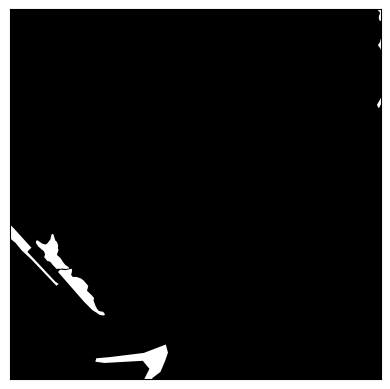

In [24]:
def creating_dataset(grid, forest, images_dir, labels_images_dir, overlay_images_dir):
    ax = forest.plot(color='#FFFFFF', zorder=1)
    ax.set_facecolor("black")
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

    for index, poly in grid.geometry.items():
        poly_mapped = shapely.geometry.mapping(poly)
        poly_coordinates = poly_mapped['coordinates'][0][:4]
        if index < 10:
            right_top = poly_coordinates[1]
            left_bottom = poly_coordinates[-1]
            x0, y0 = left_bottom
            x1, y1 = right_top

            bbox = [x0, x1, y0, y1]
            ax.axis(bbox)
            filename_label = str(index) + "_label_img" + ".jpg"
            path_label = os.path.join(labels_images_dir, filename_label)
            plt.savefig(path_label, bbox_inches='tight', pad_inches=0, dpi=220)

            filename_img_tif = str(index) + "_img" + ".tif"
            filename_img_jpg = str(index) + "_img" + ".jpg"
            path_img_tif = os.path.join(images_dir, filename_img_tif)
            path_img_jpg = os.path.join(images_dir, filename_img_jpg)
            tms_to_geotiff(output=path_img_tif,
                           bbox=[x0, y0, x1, y1],
                           zoom=15,
                           source="Satellite",
                           overwrite=True)

            overlay = Image.open(path_label)
            background = Image.open(path_img_tif)
            overlay = overlay.resize(background.size)
            background = background.convert("RGBA")
            overlay = overlay.convert("RGBA")

            new_img = Image.blend(background, overlay, 0.5)

            filename_overlay = str(index) + "_overlay_img" + ".png"
            path_overlay = os.path.join(overlay_images_dir, filename_overlay)
            new_img = new_img.save(path_overlay)
            background = background.convert("RGB")
            background = background.save(path_img_jpg)
            os.remove(path_img_tif)




creating_dataset(grid, forest, images_dir, labels_images_dir, overlay_images_dir)

In [ ]:
!zip -r /content/overlay.zip /content/overlay

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


  adding: content/overlay/ (stored 0%)
  adding: content/overlay/6_overlay_img.png (deflated 0%)
  adding: content/overlay/4_overlay_img.png (deflated 0%)
  adding: content/overlay/0_overlay_img.png (deflated 0%)
  adding: content/overlay/9_overlay_img.png (deflated 0%)
  adding: content/overlay/2_overlay_img.png (deflated 0%)
  adding: content/overlay/3_overlay_img.png (deflated 0%)
  adding: content/overlay/8_overlay_img.png (deflated 0%)
  adding: content/overlay/7_overlay_img.png (deflated 0%)
  adding: content/overlay/5_overlay_img.png (deflated 0%)
  adding: content/overlay/1_overlay_img.png (deflated 0%)


In [ ]:
import shutil

if os.path.exists(images_dir):
    shutil.rmtree(images_dir, ignore_errors=True)
    print("Deleted {} directory successfully".format(images_dir))

if os.path.exists(labels_images_dir):
    shutil.rmtree(labels_images_dir, ignore_errors=True)
    print("Deleted {} directory successfully".format(labels_images_dir))

if os.path.exists(overlay_images_dir):
    shutil.rmtree(overlay_images_dir, ignore_errors=True)
    print("Deleted {} directory successfully".format(overlay_images_dir))

In [ ]:
# m_leafmap = leafmap.Map()
# m_leafmap.add_gdf(gr, layer_name="SPb")
# # m_leafmap

# m_leafmap.add_gdf(forest, layer_name="Forest")
# # m_leafmap

# m_leafmap.add_basemap("SATELLITE")
# m_leafmap

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [ ]:
forest.head()